In [1]:
import pandas as pd
import os
import glob
import smopy
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap
import numpy as np
from scipy import ndimage
from datetime import datetime
import imageio
%matplotlib inline

In [2]:
# load all of the into a list and concatenate them to a single table
INPUT_FOLDER = 'processed_data/'

list_df = []
for file in os.listdir(INPUT_FOLDER):
    df = pd.read_csv(INPUT_FOLDER + file)
    list_df.append(df)
df = pd.concat(list_df, ignore_index=True)
df.drop('Unnamed: 0', inplace=True, axis=1)
df['datetime'] = pd.to_datetime(df['datetime'], errors='ignore')
df.head()

C:\Users\admin\Anaconda3\lib\site-packages\IPython\core\interactiveshell.py:2717: DtypeWarning: Columns (11) have mixed types. Specify dtype option on import or set low_memory=False.
  interactivity=interactivity, compiler=compiler, result=result)


,acceleration,altitude,datetime,distance,labels,lat,long,subfolder,timedelta,trajectory_id,velocity
0,-0.003189,492.0,2008-10-23 02:53:04,3.520694,NaN,39.984702,116.318417,0.0,0 days 00:00:06.000000000,20081023025304,0.586782
1,-0.003841,492.0,2008-10-23 02:53:10,2.838241,NaN,39.984683,116.318450,0.0,0 days 00:00:05.000000000,20081023025304,0.567648
2,0.332144,492.0,2008-10-23 02:53:15,2.742220,NaN,39.984686,116.318417,0.0,0 days 00:00:05.000000000,20081023025304,0.548444
3,0.391130,492.0,2008-10-23 02:53:20,11.045822,NaN,39.984688,116.318385,0.0,0 days 00:00:05.000000000,20081023025304,2.209164
4,0.072513,492.0,2008-10-23 02:53:25,20.824082,NaN,39.984655,116.318263,0.0,0 days 00:00:05.000000000,20081023025304,4.164816


In [3]:
# drop entities without a label
df_labeled = df.dropna(subset=['labels'])
df_labeled.reset_index(drop=True, inplace=True)
df_labeled.head()

,lat,long,altitude,datetime,timedelta,distance,velocity,acceleration,trajectory_id,subfolder,labels
0,39.894178,116.318200,-777.0,2008-03-28 14:54:40,0 days 00:00:34.000000000,253.375124,7.452210,0.008984,20080328144824,10,train
1,39.894505,116.321132,-777.0,2008-03-28 14:55:14,0 days 00:00:59.000000000,457.703187,7.757681,0.018562,20080328144824,10,train
2,39.894953,116.326452,-777.0,2008-03-28 14:56:13,0 days 00:00:59.000000000,522.318591,8.852857,0.043408,20080328144824,10,train
3,39.894600,116.332542,-777.0,2008-03-28 14:57:12,0 days 00:00:59.000000000,673.422399,11.413939,0.048946,20080328144824,10,train
4,39.889622,116.337040,-777.0,2008-03-28 14:58:11,0 days 00:00:59.000000000,843.803760,14.301759,0.015336,20080328144824,10,train


In [4]:
# split the table to distinct trajectories woth respect to its subfolder
trajectories = dict()
for subfolder in df_labeled['subfolder'].unique():
    trajectories[subfolder] = dict()
    for trajectory_id in df_labeled[df_labeled['subfolder'] == subfolder]['trajectory_id'].unique():
        trajectories[subfolder][trajectory_id] = df_labeled[df_labeled['subfolder'] == subfolder][df_labeled['trajectory_id'] == trajectory_id]
        trajectories[subfolder][trajectory_id].reset_index(drop=True, inplace=True)
trajectories[10][20080328144824]

C:\Users\admin\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  


,lat,long,altitude,datetime,timedelta,distance,velocity,acceleration,trajectory_id,subfolder,labels
0,39.894178,116.318200,-777.0,2008-03-28 14:54:40,0 days 00:00:34.000000000,253.375124,7.452210,0.008984,20080328144824,10,train
1,39.894505,116.321132,-777.0,2008-03-28 14:55:14,0 days 00:00:59.000000000,457.703187,7.757681,0.018562,20080328144824,10,train
2,39.894953,116.326452,-777.0,2008-03-28 14:56:13,0 days 00:00:59.000000000,522.318591,8.852857,0.043408,20080328144824,10,train
3,39.894600,116.332542,-777.0,2008-03-28 14:57:12,0 days 00:00:59.000000000,673.422399,11.413939,0.048946,20080328144824,10,train
4,39.889622,116.337040,-777.0,2008-03-28 14:58:11,0 days 00:00:59.000000000,843.803760,14.301759,0.015336,20080328144824,10,train
5,39.882090,116.338353,-777.0,2008-03-28 14:59:10,0 days 00:01:00.000000000,912.394041,15.206567,0.019319,20080328144824,10,train
6,39.873873,116.338455,-777.0,2008-03-28 15:00:10,0 days 00:00:59.000000000,965.577796,16.365725,0.034649,20080328144824,10,train
7,39.865182,116.338058,-777.0,2008-03-28 15:01:09,0 days 00:00:59.000000000,1086.189677,18.409995,0.044349,20080328144824,10,train
8,39.855403,116.337710,-777.0,2008-03-28 15:02:08,0 days 00:00:59.000000000,1240.567528,21.026568,0.085104,20080328144824,10,train
9,39.844532,116.334362,-777.0,2008-03-28 15:03:07,0 days 00:00:59.000000000,1536.815794,26.047725,0.043109,20080328144824,10,train


In [5]:
# look at the trajectory labels
all_labels = dict()
for key1 in trajectories.keys():
    for key2 in trajectories[key1]:
        all_labels[key2] = trajectories[key1][key2]['labels'].unique()
print("Example of trajectory labels:")
for i in range(10):
    print(all_labels[list(all_labels.keys())[i]])

Example of trajectory labels:
['train']
['train']
['train']
['train']
['train']
['taxi' 'train' 'walk']
['walk' 'taxi' 'bus']
['train' 'walk' 'taxi']
['train' 'walk' 'taxi']
['train']


In [6]:
# extract trajectories with single modality
single_modality_trajectory_ids = [key for key in all_labels.keys() if len(all_labels[key]) == 1]
df_single_modality = df_labeled[df_labeled['trajectory_id'].isin(single_modality_trajectory_ids)]
df_single_modality.reset_index(drop=True, inplace=True)
df_single_modality.head()

,lat,long,altitude,datetime,timedelta,distance,velocity,acceleration,trajectory_id,subfolder,labels
0,39.894178,116.318200,-777.0,2008-03-28 14:54:40,0 days 00:00:34.000000000,253.375124,7.452210,0.008984,20080328144824,10,train
1,39.894505,116.321132,-777.0,2008-03-28 14:55:14,0 days 00:00:59.000000000,457.703187,7.757681,0.018562,20080328144824,10,train
2,39.894953,116.326452,-777.0,2008-03-28 14:56:13,0 days 00:00:59.000000000,522.318591,8.852857,0.043408,20080328144824,10,train
3,39.894600,116.332542,-777.0,2008-03-28 14:57:12,0 days 00:00:59.000000000,673.422399,11.413939,0.048946,20080328144824,10,train
4,39.889622,116.337040,-777.0,2008-03-28 14:58:11,0 days 00:00:59.000000000,843.803760,14.301759,0.015336,20080328144824,10,train


In [7]:
# compare previous results
print("\nTotal number of trajectories: {}".format(len(df['trajectory_id'].unique())))
print("Total number of labeled trajectories: {}".format(len(df_labeled['trajectory_id'].unique())))
print("Total number of single modality trajectories: {}".format(len(df_single_modality['trajectory_id'].unique())))


Total number of trajectories: 17784
Total number of labeled trajectories: 4358
Total number of single modality trajectories: 2758


In [8]:
# show walk trajectories
df_walk = df_single_modality[df_single_modality['labels'] == 'walk']
df_walk.describe()

,lat,long,altitude,distance,velocity,acceleration,trajectory_id,subfolder
count,341560.000000,341560.000000,341560.000000,340847.000000,287264.000000,2.712720e+05,3.415600e+05,341560.000000
mean,39.697036,116.081684,382.124921,5.368557,1.908500,-1.876968e-02,2.008930e+13,104.760888
std,1.821709,7.528822,1070.623673,111.085016,3.128688,1.222528e+00,1.305898e+10,39.311919
min,22.260945,-122.140210,-12857.600000,0.000000,0.000000,-1.005352e+02,2.007041e+13,10.000000
25%,39.969523,116.307585,0.000000,1.084773,0.865466,-1.867685e-01,2.008072e+13,68.000000
50%,39.975436,116.327314,160.800000,2.402258,1.340629,-7.231652e-08,2.008110e+13,112.000000
75%,39.980755,116.335578,232.900000,4.028963,1.975709,1.697606e-01,2.011041e+13,141.000000
max,49.591972,126.988720,13376.000000,41341.741885,453.194189,1.371785e+02,2.011123e+13,179.000000


Lowered zoom level to keep map size reasonable. (z = 2)


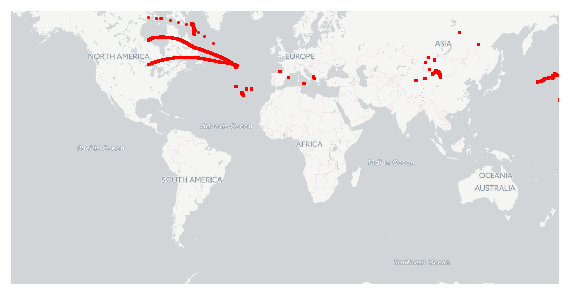

In [3]:
# Plot the coordinates
smopy.TILE_SERVER = "http://tile.basemaps.cartocdn.com/light_all/{z}/{x}/{y}.png"
smopy.TILE_SIZE = 256

latMin = min(df.lat)
latMax = max(df.lat)
longMin = min(df.long)
longMax = max(df.long)

mapAll = smopy.Map((latMin, longMin, latMax, longMax ), z=10)
x, y = mapAll.to_pixels(df.lat, df.long)
ax = mapAll.show_mpl(figsize=(8, 6))
ax.plot(x, y, 'or', ms=2)

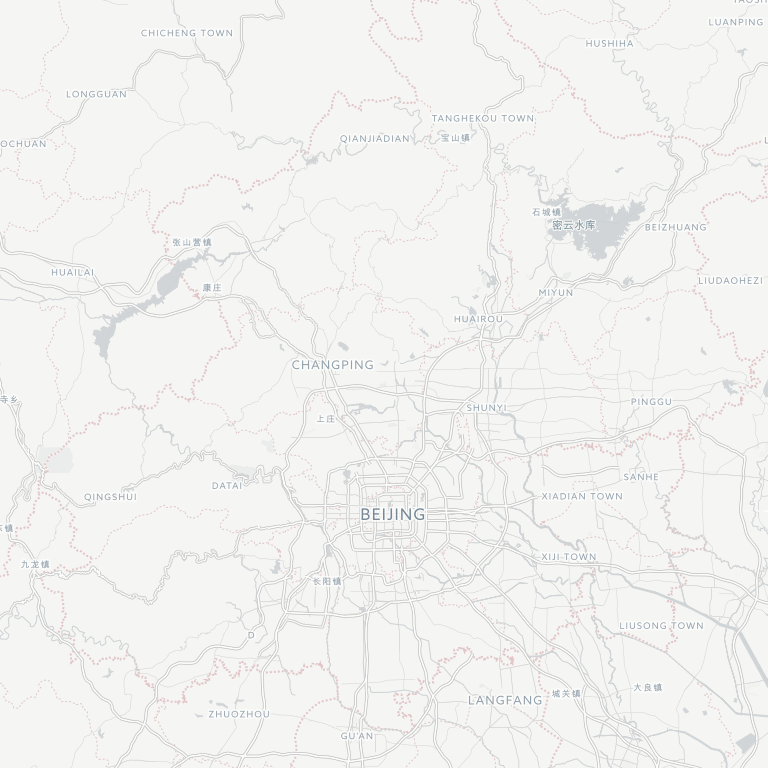

In [4]:
# Beijing
latMinB = 39.64
latMaxB = 40.51
longMinB = 115.76
longMaxB = 116.88

mapBeijing = smopy.Map((latMinB, longMinB, latMaxB, longMaxB ), z=9)
mapBeijing.show_ipython()

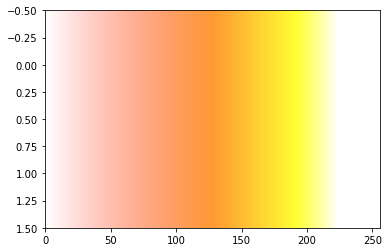

In [5]:
# build a heatmap to check out the busy areas
df['xPixel'] = mapBeijing.to_pixels(df.lat, df.long)[0]
df['yPixel'] = mapBeijing.to_pixels(df.lat, df.long)[1]

dfBeijing = df[(df.lat.between(latMinB, latMaxB)) & (df.long.between(longMinB, longMaxB))]

cmap = LinearSegmentedColormap.from_list('mycmap', [(0, (1,0,0,0)), (0.5, (1,0.5,0,0.8)), (0.75, (1,1,0,0.8)), (0.875, (1,1,1,1)), (1, (1,1,1,1))])

gradient = np.linspace(0, 1, 256)
gradient = np.vstack((gradient, gradient))
fig, ax = plt.subplots()
ax.imshow(gradient, aspect='auto', cmap=cmap)

C:\Users\admin\Anaconda3\lib\site-packages\ipykernel_launcher.py:12: RuntimeWarning: divide by zero encountered in log
  if sys.path[0] == '':


11.056707312449186

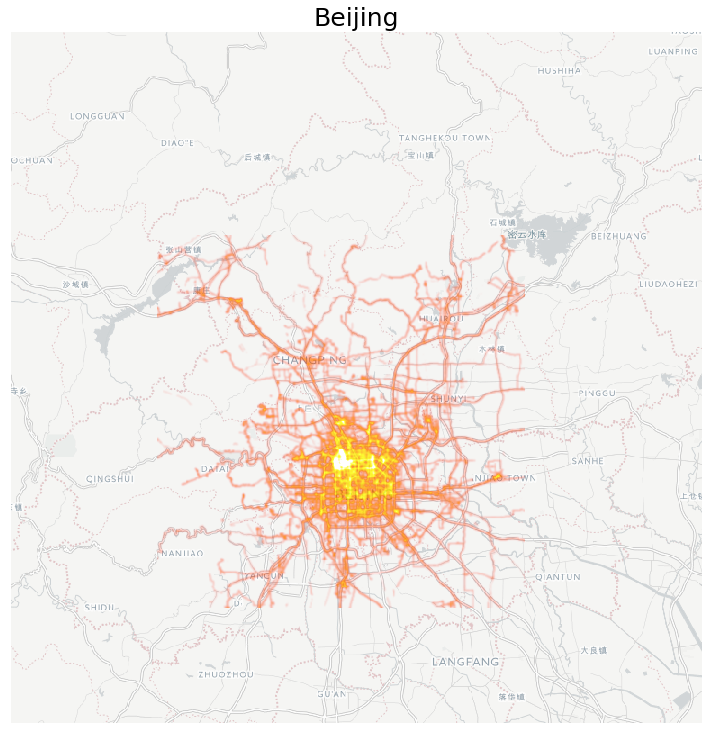

In [12]:
ax = mapBeijing.show_mpl(figsize=(12, 10))
bins=400
smoothing =1.

title = 'Beijing'

x = list(dfBeijing['xPixel'])
y = list(dfBeijing['yPixel'])
heatmap, xedges, yedges = np.histogram2d(y, x, bins=bins)
extent = [yedges[0], yedges[-1], xedges[-1], xedges[0]]
    
logheatmap = np.log(heatmap)
logheatmap[np.isneginf(logheatmap)] = 0
logheatmap = ndimage.filters.gaussian_filter(logheatmap, smoothing, mode='nearest')

ax.set_title(title, size=25)

plt.savefig(title+'.png', bbox_inches='tight')
    
ax.imshow(logheatmap, cmap=cmap, extent=extent, vmin=0, vmax=10)

plt.savefig(title+'.png', bbox_inches='tight')

np.amax(logheatmap)

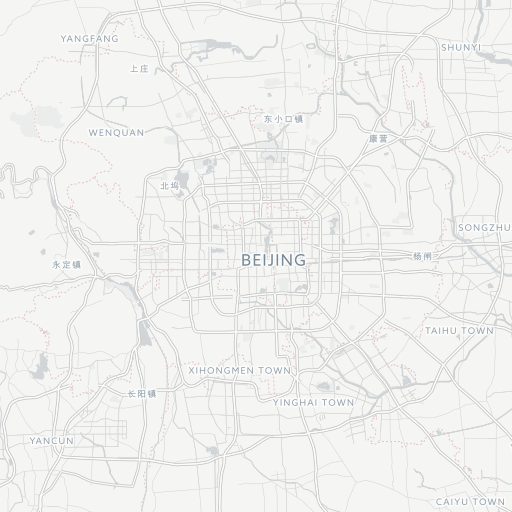

In [7]:
# put the heatmap into a function and zoom into the central area
def heatMap(long, lat, area, bins=200, smoothing=1, vmax=4, title=None):
    x = area.to_pixels(lat, long)[0]
    y = area.to_pixels(lat, long)[1]
    
    ax = area.show_mpl(figsize=(12, 10))
    
    heatmap, xedges, yedges = np.histogram2d(y, x, bins=bins)
    extent = [yedges[0], yedges[-1], xedges[-1], xedges[0]]
    
    logheatmap = np.log(heatmap)
    logheatmap[np.isneginf(logheatmap)] = 0
    logheatmap = ndimage.filters.gaussian_filter(logheatmap, smoothing, mode='nearest')
    
    output = ax.imshow(logheatmap, cmap=cmap, extent=extent, vmin=0, vmax=vmax)
    
    if title:
        ax.set_title(title, size=25)
        plt.savefig(title+'.png', bbox_inches='tight')
    
    print(np.amax(logheatmap))
    return output

latMin = 39.8
latMax = 40
longMin = 116.2
longMax = 116.4

mapZoom = smopy.Map((latMin, longMin, latMax, longMax ), z=10)
mapZoom.show_ipython()

C:\Users\admin\Anaconda3\lib\site-packages\ipykernel_launcher.py:11: RuntimeWarning: divide by zero encountered in log
  # This is added back by InteractiveShellApp.init_path()


10.492092294


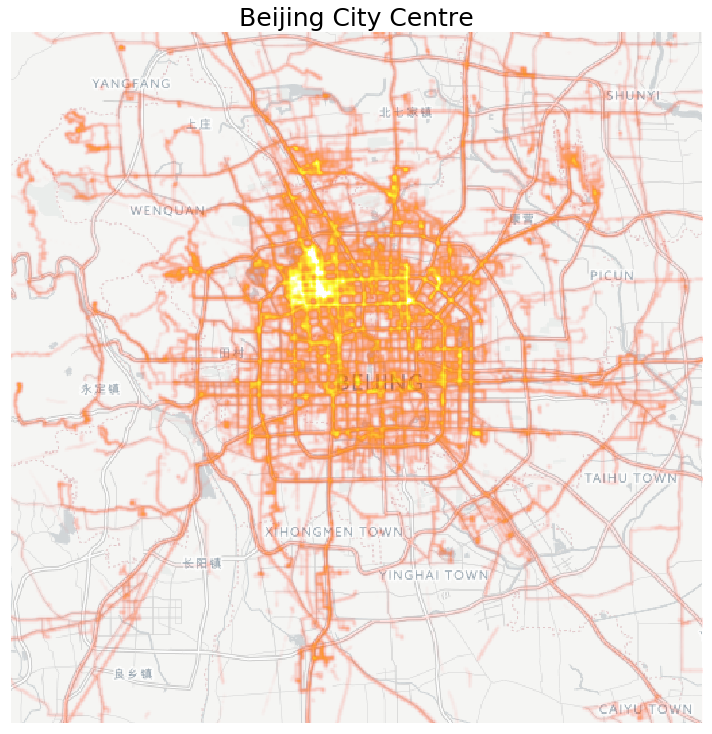

In [14]:
heatMap(dfBeijing.long, dfBeijing.lat, mapZoom, bins=800, vmax=10, title='Beijing City Centre')

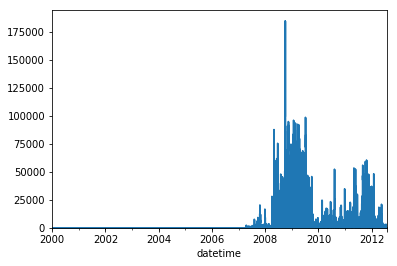

In [15]:
df.set_index('datetime', inplace=True)
df.resample('D').count().lat.plot(kind='area')

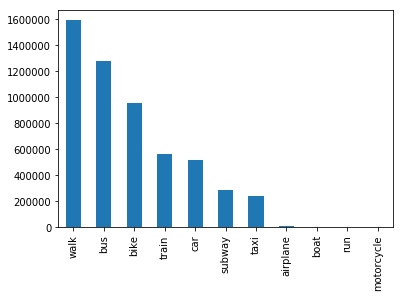

In [16]:
df_labeled['labels'].value_counts().plot(kind='bar')

C:\Users\admin\Anaconda3\lib\site-packages\ipykernel_launcher.py:11: RuntimeWarning: divide by zero encountered in log
  # This is added back by InteractiveShellApp.init_path()


7.58034581681


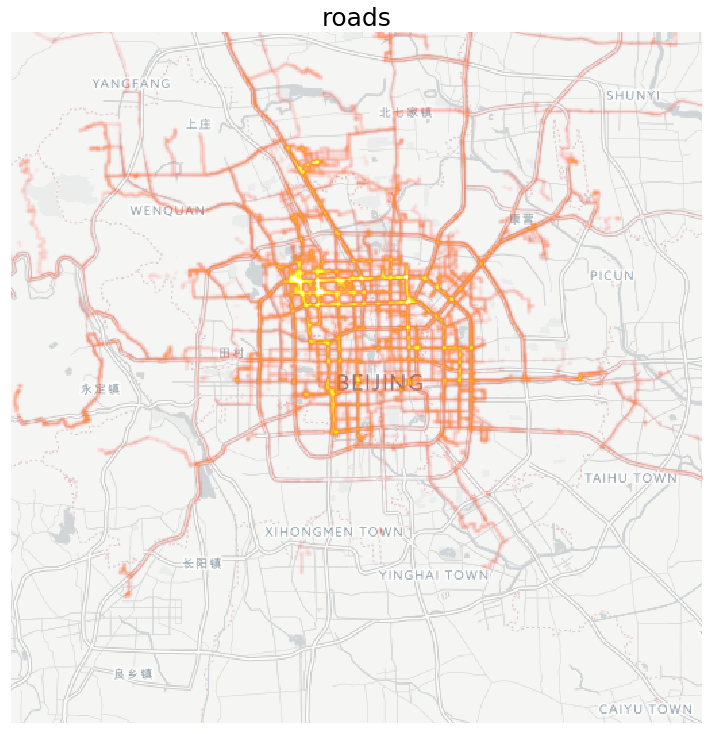

In [17]:
# the busiest roads
dfRoads = dfBeijing[dfBeijing['labels'].isin(['car', 'bus', 'taxi'])]

heatMap(dfRoads.long, dfRoads.lat, mapZoom, bins=800, vmax=7, title='roads')

C:\Users\admin\Anaconda3\lib\site-packages\ipykernel_launcher.py:11: RuntimeWarning: divide by zero encountered in log
  # This is added back by InteractiveShellApp.init_path()


8.6883503981


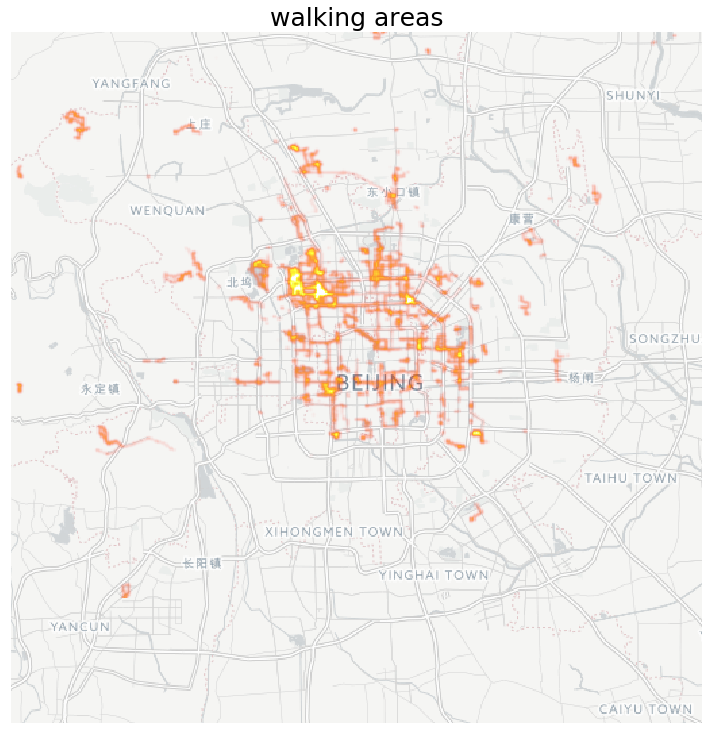

In [8]:
# walking areas
dfWalking = dfBeijing[dfBeijing['labels'] == 'walk']

heatMap(dfWalking.long, dfWalking.lat, mapZoom, bins=800, vmax=8, title='walking areas')

C:\Users\admin\Anaconda3\lib\site-packages\ipykernel_launcher.py:11: RuntimeWarning: divide by zero encountered in log
  # This is added back by InteractiveShellApp.init_path()


6.87096408923


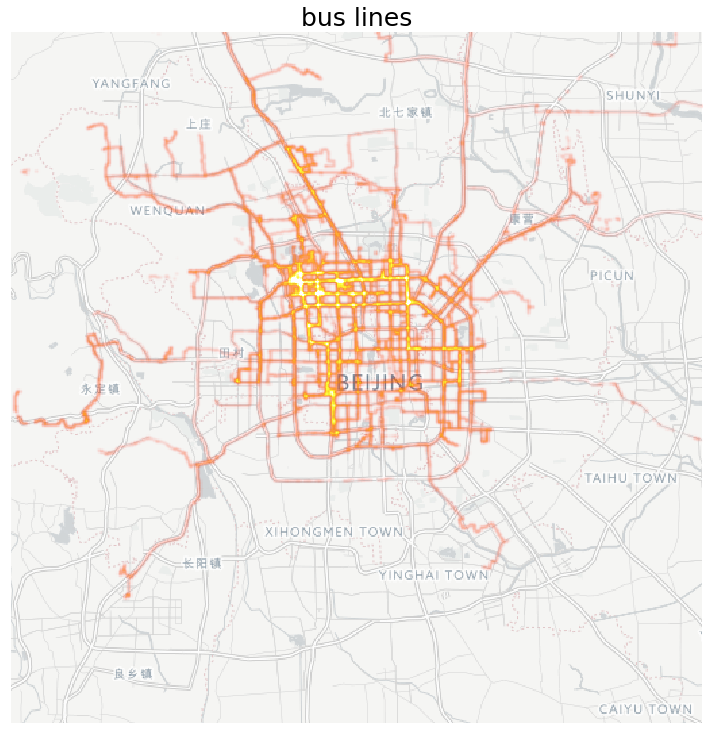

In [19]:
# bus lines
dfBus = dfBeijing[dfBeijing['labels'] == 'bus']

heatMap(dfBus.long, dfBus.lat, mapZoom, bins=800, vmax=6, title='bus lines')

C:\Users\admin\Anaconda3\lib\site-packages\ipykernel_launcher.py:11: RuntimeWarning: divide by zero encountered in log
  # This is added back by InteractiveShellApp.init_path()


7.69997566053
8.11713726928
7.87009343994
7.12243641377
7.13772556027
7.19718098702
7.31042783884
7.23222176521
7.267635811
7.2766711002
7.60215080783
7.63676858213
7.56883977891
7.53529764305
7.60097218924
7.32701803104
6.68125687819
6.15276018902
6.03434660361
5.24208123584


C:\Users\admin\Anaconda3\lib\site-packages\matplotlib\pyplot.py:524: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


5.51949226552
5.80578798472
6.07265954656
6.51319154824


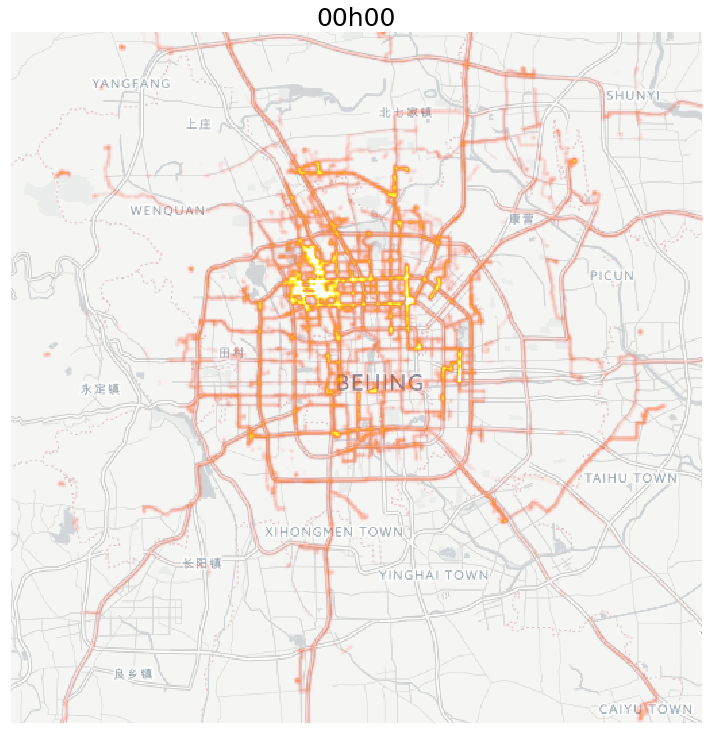

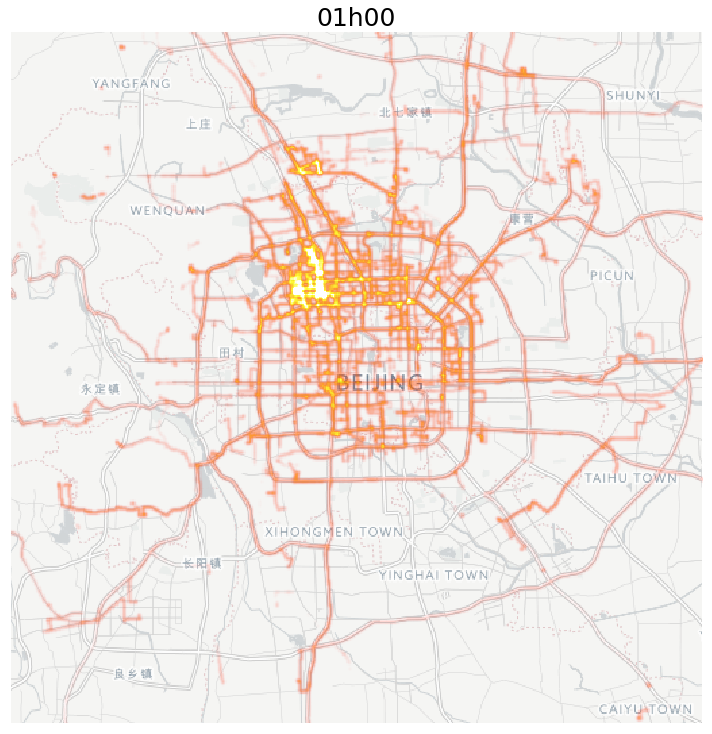

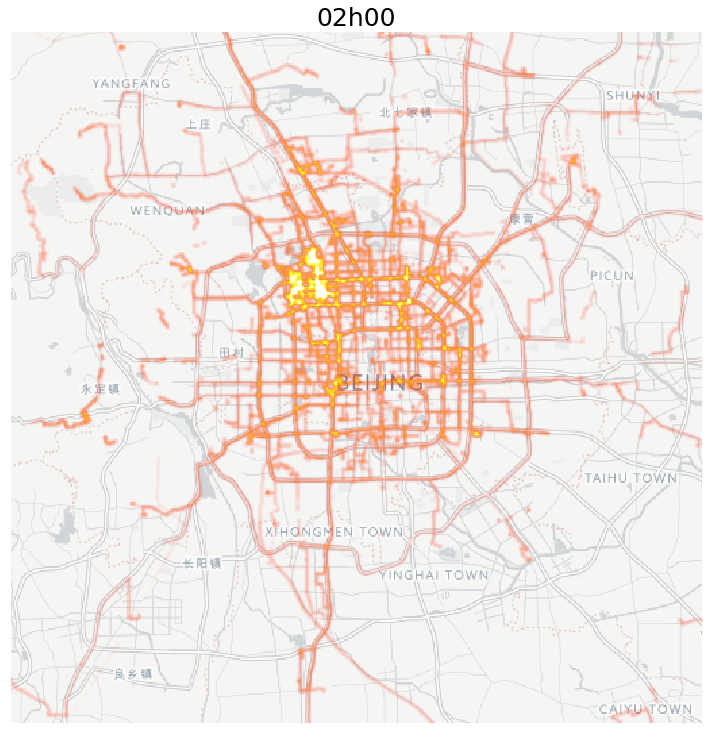

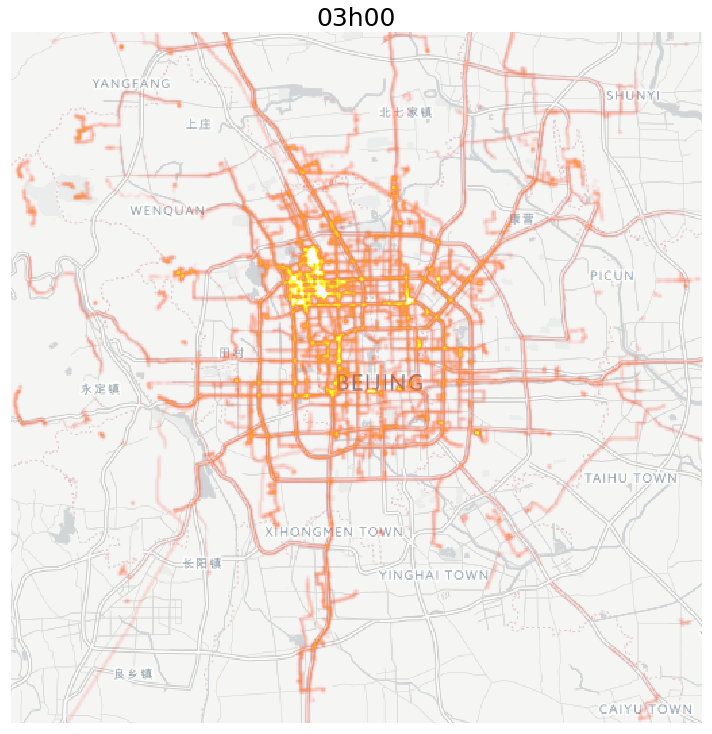

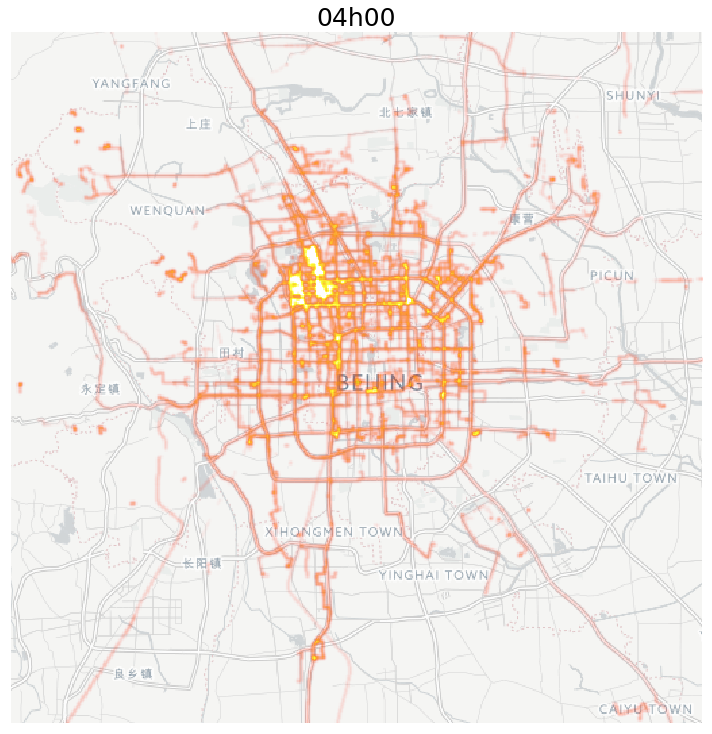

...

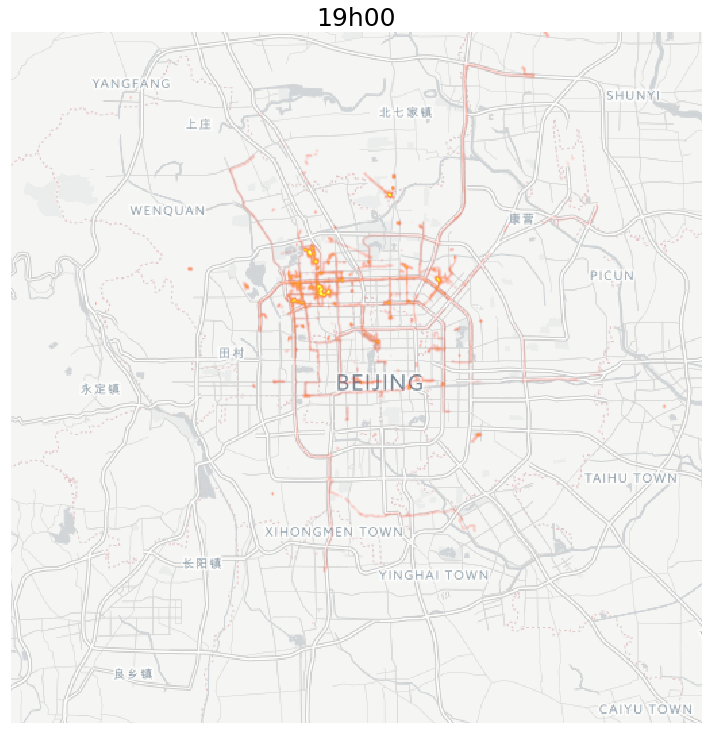

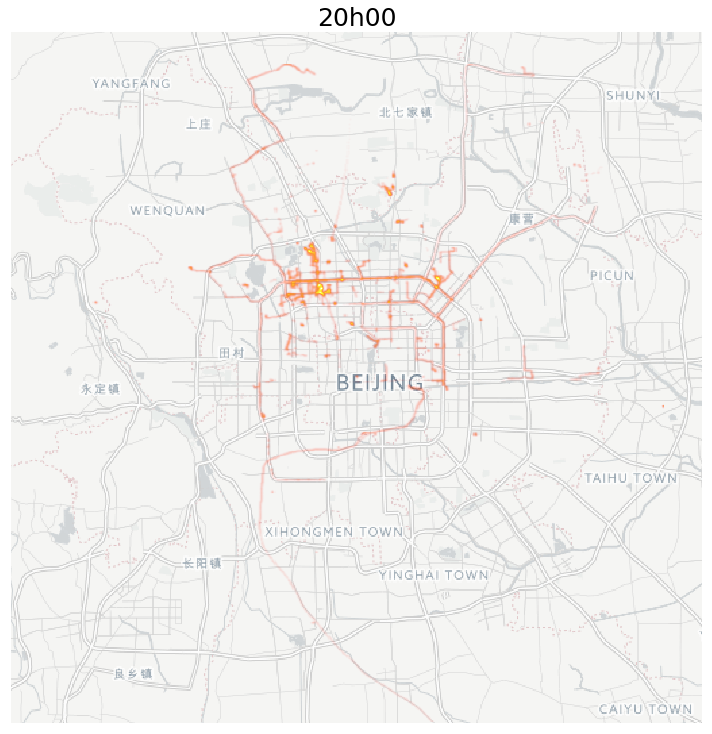

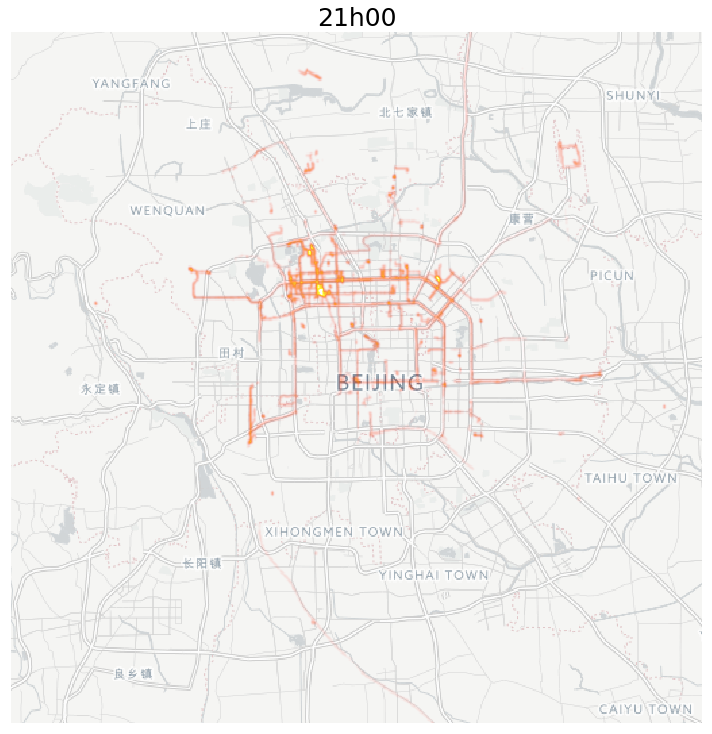

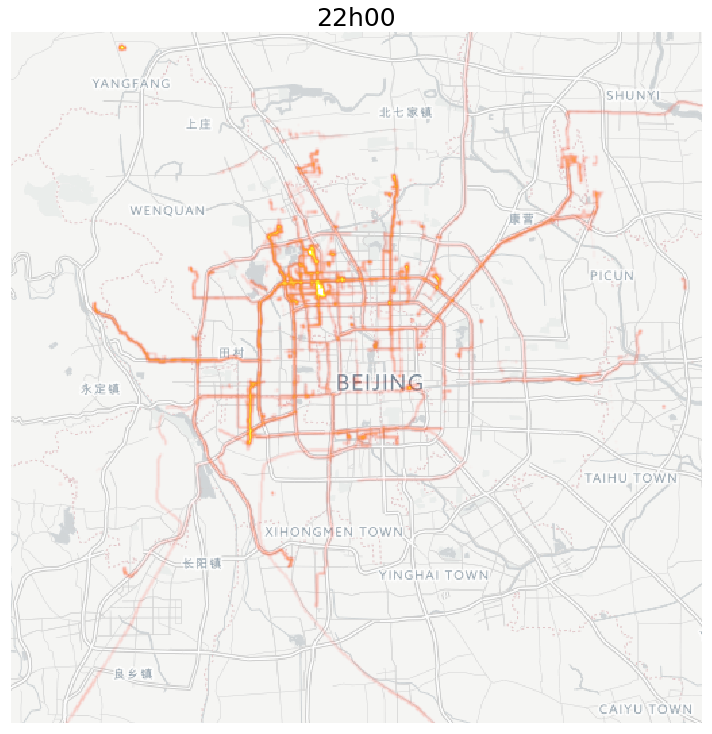

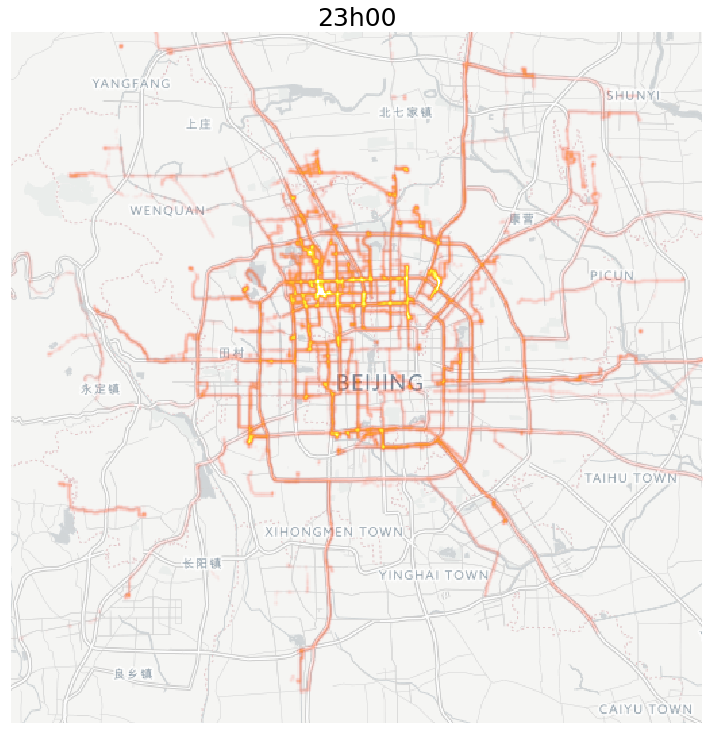

In [20]:
# hourly data
def getTime(x):
    return datetime.strptime(str(x), '%H').strftime('%Hh%M')

for i in range(24):
    dfHour = dfBeijing[dfBeijing['datetime'].dt.hour == i]
    heatMap(dfHour.long, dfHour.lat, mapZoom, bins=800, vmax=6, title=getTime(i))


files = glob.glob('*h00.png')
images = []
for file in files:
    images.append(imageio.imread(file))
imageio.mimsave('24hBeijing.gif', images)